# L46 Principles of Machine Learning Systems
## Model Expansion


### Name - Amogh Singh


### CRSid - as3600

This is the report part of the notebook which contains the experiment descriptions and the analysis of the results from the experiments. 

The codes is in two notebooks and is distributed as follows-

L46_as3600_Notebook1.ipynb
- Experiment 1 - Model expansion using student-teacher training

L46_as3600_Notebook2.ipynb
- Experiment 2 - Model expansion - Scaling Smart
- Experiment 3 - Scaling noise
- Experiment 4 - Envelope expansion
- Experiment 5 - Net2Net comparison

There are more than 3 experiments in this notebook in order to better organize the work and the improvements made over consecutive experiments. 

The first experiment is performed using PyTorch while the other experiments are done in TensorFlow as training Metal is faster for training models on MPS (Mac Silicon).


All the code and associated files are uploaded on GitHub - https://github.com/AmoghSingh25/L46_Mini_Project

Model Growth can be understood as the inverse of knowledge distillation. It can be a useful method for expanding the knowledge of smaller pre-trained models to larger models. This can potentially reduce the additional computation required, allow for transfer of knowledge from the smaller models without discarding previous work and instead of training from scratch, the newer larger models can be built upon the knowledge of previous smaller models. 

Traditionally, in knowledge distillation, the aim is to teach a smaller network the knowledge contained in a larger model. This can be useful for model compression and increasing the speed by distilling into a smaller, faster model. 

The objective of the model growth, however, is to use previously trained smaller models when the models are expanded. Expansion of models is common where larger and larger models are made in an attempt to capture more information and improve their abilities. This trend can be see in Large Language Models (LLMs) where the parameters in the models are increased in an attempt to improve the performance. A similar trend is seen in usecases also, where, due to the increasing amount of compute available, larger models are being trained. 

However, the techniques for training these larger models is generally one of the following
1) Train the entire model from scratch on the dataset
2) Use the weights of the model trained on another dataset and fine-tune on those weights. For example, for image classification, model weights pre-trained on ImageNet are used to reduce computation overhead associated with training from scratch.

These techniques are either very computationally heavy or are dependant on previous weights from a different objective which might not scale well to the intended task. One possible solution for this could be to re-use the data from a smaller pre-trained model for initializing the larger model.


I believe with this method, one or more of the following can be achieved:
1) Computation spent on training smaller models is not wasted and is redeemable as it can be used for training the larger model.
2) The larger model is using weights of a model trained on the same objective, which can improve performance of the model.
3) The initialization of weights can be more effective than the random initialization. This can reduce the computation required.

In order to validate if the method is effective, some of the conditions to meet would be 

Firstly, the method reduces the computation required for training a larger model.

Secondly, the method needs to be able to converge better than training from scratch. This would show that the weights carried over from the smaller model are useful for improving convergence.

There have been a few published methods which look at techniques to reuse the weights of smaller trained models for larger, expanded models. This project will look at these methods and compare their workings and performance.

Through this work, I aim to check if the existing works on expanding layers, which exist for LLMs, can achieve similar results in applications involving image classification. I also try to improve the techniques in order to gain a higher performance while keeping the core ideaology similar, i.e., expansion of weights from the previously trained model.

# Experiment - 1
## Model expansion using student-teacher training


The first experiment looks to check if it is possible to use a smaller trained network for training a larger network. This experiment uses a similar process as used in knowledge distillation, but the smaller model is the teacher network which is used to train the larger model, acting as the student network. 


For this experiment, the FashionMNIST dataset is used on two simple models. A simple model configuration is chosen as there are multiple runs per configuration and this experiment only intends to study the potential of model growth using the knowledge distillation process. There are 5 configurations that are studied where a weight is assigned to the logits of the small model and the logits of the last layer of the large model. 


The descriptions of the two models are as follows

## Small Model

| **Layer**          | **Output Shape**      | 
|---------------------------|-----------------------|
| **Dense**             | (1024, 64)          |
| **Dense**                | (64, 128)         |
| **Dense**          | (128, 10)         |


## Large Model

| **Layer**          | **Output Shape**      | Note |
|---------------------------|-----------------------| ---- |
| **Dense**             | (1024, 128)          | Expanded,  (1024,64) -> (1024,128)|
| **Dense**                | (128, 256)         | Expanded,  (64,128) -> (128,256) |
| **Dense**          | (256, 10)         | Expanded, (128,10) -> (256,10) |



In order to demonstrate that using pre-trained small models are useful for increasing the performance, we would like to see a better performance when the weight assigned to the small model is increased.

The setups are as described below

| Setup | Note |
| ------ | ---- |
| Reference | Large model trained on the dataset from scratch |
| 1:1 | 1:Small model logits, 1:Labels |
| 1:3 | 1:Small model logits, 3:Labels |
| 3:1 | 3:Small model logits, 1:Labels |
| 1:5 | 1:Small model logits, 5:Labels |
| 5:1 | 5:Small model logits, 1:Labels |


In the expansion training, for each configuration, the expansion training is performed for 3 runs, where each run a new large model is instantiated and trained for 30 steps. The accuracy and loss from this training is stored and analysed below. 

The FashionMNIST dataset is used for this experiment. Gaussian noise is added to the images as without the Gaussian noise, the models were achieving 100% accuracy and deriving conclusions from this was difficult.

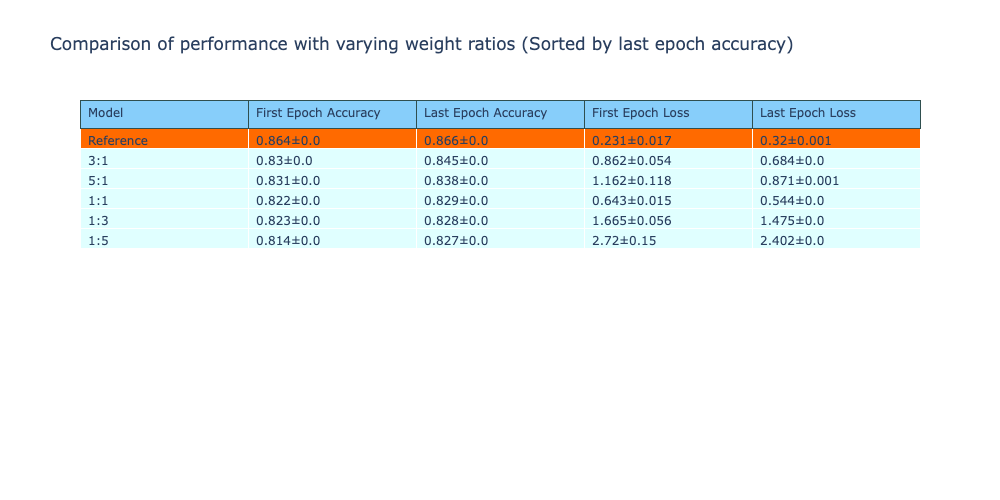

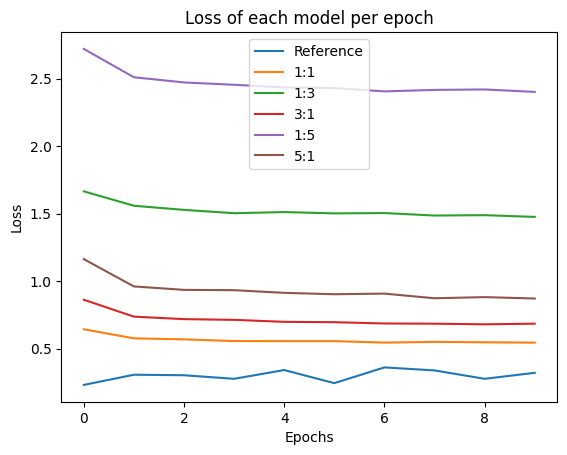 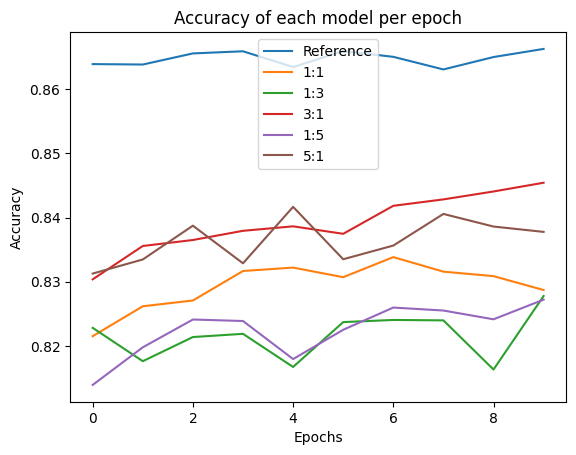

## Findings
From this experiment, it is clear that this technique is unable to improve the performance of the expanded models compared to training the model from scratch. 

However, an inference that I was able to derive is that by assigning a higher weight to the small model logits, there is an improvement in the final accuracy of the model. Both the configurations that put higher importance on the student model logits had a higher accuracy compared to the configurations that put a higher importance on the last layer logits of the large model.

Training from scratch, however, was still the best performing method. In the next few experiments, I will look at model expansion techniques. These should perform better than training from scratch. 

# Experiment - 2
## Model Expansion - Scaling Smart: Accelerating Large Language Model Pre-training with Small Model Initialization

## [Samragh, Mohammad, et al. "Scaling smart: Accelerating large language model pre-training with small model initialization." arXiv preprint arXiv:2409.12903 (2024)](https://arxiv.org/abs/2409.12903)


This experiment looks at weight expansion techniques as presented in the paper Scaling Smart: Accelerating Large Language Model Pre-training with Small Model Initialization. The paper looks at techniques for expanding hidden weights of language models so that small pre-trained language models can be used for initializing the parameters of larger language models instead of random initialization. 

In weight expansion, the weights of the small models are used for initiating the expanded layers of the large model and then further trained using these weights. The paper describes four methods of weight expansion in the hidden layers which are implemented in this experiment. 

These expansion methods are descibed as function preserving, where after expansion, the outputs of the model after weight expansion is the same as the output of the small model.

Compared to the previous experiment which is using the same flow as knowledge distillation, this method makes use of the trained small model weights for initializing the weights of the larger model. This should allow it to perform better as this is not restrictive on the smaller model's understanding and is only an initialization method before the model is trained. By using the weights of the small model for initialization, the training of the large model should benefit from this.

For this experiment, the CIFAR10 dataset is used, as it is larger than the previously used FashionMNIST dataset, making it slightly more difficult for models to perform well. As the models are also slightly more complex, these models would have all performed well on the FashionMNIST dataset and therefore a different dataset is required.

The weight expansion is performed on Linear and Convolutional layers of this model. 

The models used for these experiments are as follows

## Small Model

| **Layer**          | **Output Shape**      | **Details**                            |
|---------------------------|-----------------------|-----------------------------------------|
| **Rescaling**             | (32, 32, 3)          | Scales inputs by 1/255                 |
| **Conv2D**                | (30, 30, 32)         | Filters: 32, Kernel Size: (3, 3), ReLU |
| **MaxPooling2D**          | (15, 15, 32)         | Pool Size: (2, 2)                      |
| **Conv2D**                | (13, 13, 64)         | Filters: 64, Kernel Size: (3, 3), ReLU |
| **MaxPooling2D**          | (6, 6, 64)           | Pool Size: (2, 2)                      |
| **Conv2D**                | (4, 4, 64)           | Filters: 64, Kernel Size: (3, 3), ReLU |
| **Flatten**               | (1024)               | Flattens input                         |
| **Dense**                 | (64)                 | Units: 64, ReLU Activation             |
| **Dense**                 | (10)                 | Units: 10                              |


## Large Model - 1

| **Layer (Type)**          | **Output Shape**      | **Details**                            | Note |
|---------------------------|-----------------------|-----------------------------------------|-----|
| **Rescaling**             | (32, 32, 3)          | Scales inputs by 1/255                 ||
| **Conv2D**                | (30, 30, 32)         | Filters: 32, Kernel Size: (3, 3), ReLU ||
| **MaxPooling2D**          | (15, 15, 32)         | Pool Size: (2, 2)                      ||
| **Conv2D**                | (13, 13, 128)        | Filters: 128, Kernel Size: (3, 3), ReLU| Expanded from small model, 64 -> 128|
| **MaxPooling2D**          | (6, 6, 128)          | Pool Size: (2, 2)                      ||
| **Conv2D**                | (4, 4, 64)           | Filters: 64, Kernel Size: (3, 3), ReLU ||
| **Flatten**               | (1024)               | Flattens input                         ||
| **Dense**                 | (128)                | Units: 128, ReLU Activation            |Expanded from small model, 64 -> 128|
| **Dense**                 | (10)                 | Units: 10                              ||

## Large Model - 2
| **Layer (Type)**          | **Output Shape**      | **Details**                            | Note |
|---------------------------|-----------------------|-----------------------------------------| ---- |
| **Rescaling**             | (32, 32, 3)          | Scales inputs by 1/255                 ||
| **Conv2D**                | (30, 30, 32)         | Filters: 32, Kernel Size: (3, 3), ReLU ||
| **MaxPooling2D**          | (15, 15, 32)         | Pool Size: (2, 2)                      ||
| **Conv2D**                | (13, 13, 128)        | Filters: 128, Kernel Size: (3, 3), ReLU| Expanded from small model, 64 -> 128 |
| **MaxPooling2D**          | (6, 6, 128)          | Pool Size: (2, 2)                      | |
| **Conv2D**                | (4, 4, 128)          | Filters: 128, Kernel Size: (3, 3), ReLU| Expanded from small model, 64 -> 128 |
| **Flatten**               | (2048)               | Flattens input                         | |
| **Dense**                 | (128)                | Units: 128, ReLU Activation            |Expanded from small model, 64 -> 128 |
| **Dense**                 | (10)                 | Units: 10                              ||


In these experiments, the small model is trained on the CIFAR10 dataset for 10 epochs with an initial learning rate of 0.001 and an Exponential decay scheduler on the learning rate with decay rate as `0.5 * previous learning rate`, performed after each epoch. 

After training the small model, it achieves the following metrics


| Metric | Value |
| ------ | ----- |
| Training Accuracy | 65.3% |
| Training Loss | 1.0054 |
| Validation Accuracy | 63.21% |
| Validation Loss | 1.0696 |


This small model would be used for performing weight expansion in the following runs. 

The explanation of the different methods of expansion and a plot of the weights before and after expansion are given below. An analysis of the performance of these methods is given at the end, comparing the improvements achieved by different techniques. 

## Symmetric expansion

In symmetric expansion, the expansion of the weight matrix is symmetric as shown below

$W_{s} -> Source \ weight $

$W_{symmetric} -> Expanded \ weight$

$W_{symmetric}  = \begin{bmatrix}
W_s / 2 & W_s / 2 \\
W_s / 2 & W_s / 2
\end{bmatrix}
$

The source weights are divided by 2 in the expanded weights to ensure function preservation. 



The plots below show the weights of Linear and Convolution layers before and after expansion. In the symmetric expansion, the weights are mirrored along the expansion axis, or the axis of symmetry. The plots show the weights after performing symmetric expansion, with the same weight within the sub-matrices of the layers. As there is expansion along a single axis, the symmetric expansion assigns the source weights to the upper and lower halves of the expanded weight.


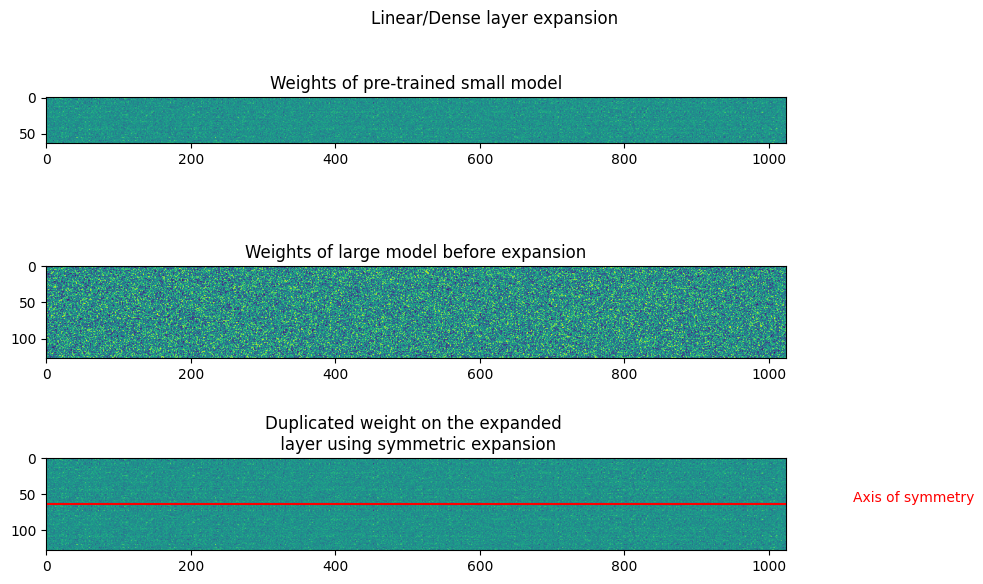

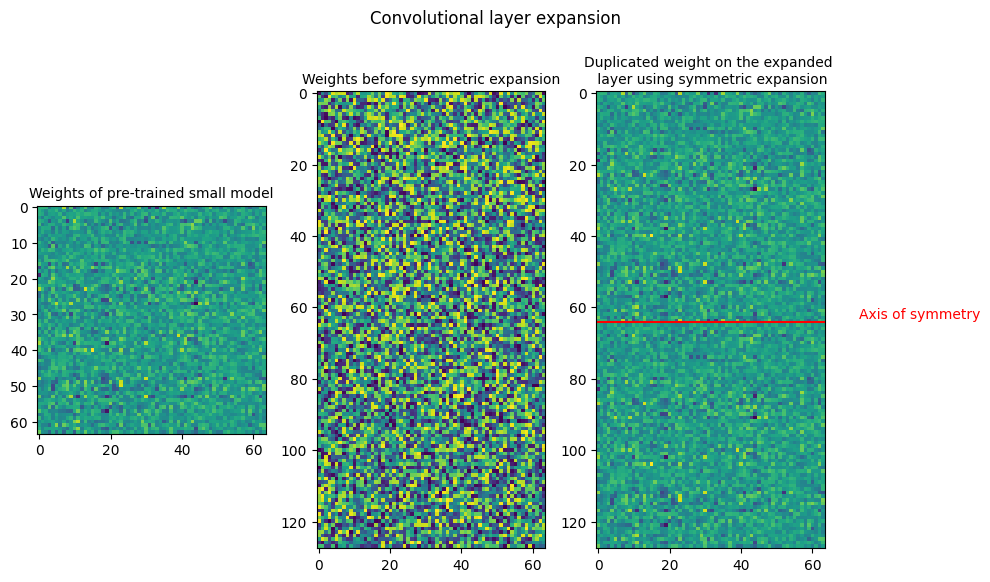

## Noisy symmetric expansion

$W_{s} -> Source \ weight $

$W_{noisy \ symmetric} -> Expanded \ weight$

$\eta_1 -> Noise 1$

$\eta_2 -> Noise 2$

$W_{noisy \ symmetric}  = \begin{bmatrix}
W_s / 2 + \eta_1 & W_s / 2 - \eta_1 \\
W_s / 2 + \eta_2 & W_s / 2 - \eta_2
\end{bmatrix}
$

The noise $\eta_1$ and $eta_2$ are added to row 1 and row 2. The noise used for the elements in each row are kept the same, with only the sign being inverted for each column. This is done to ensure function preservation during the model expansion. 

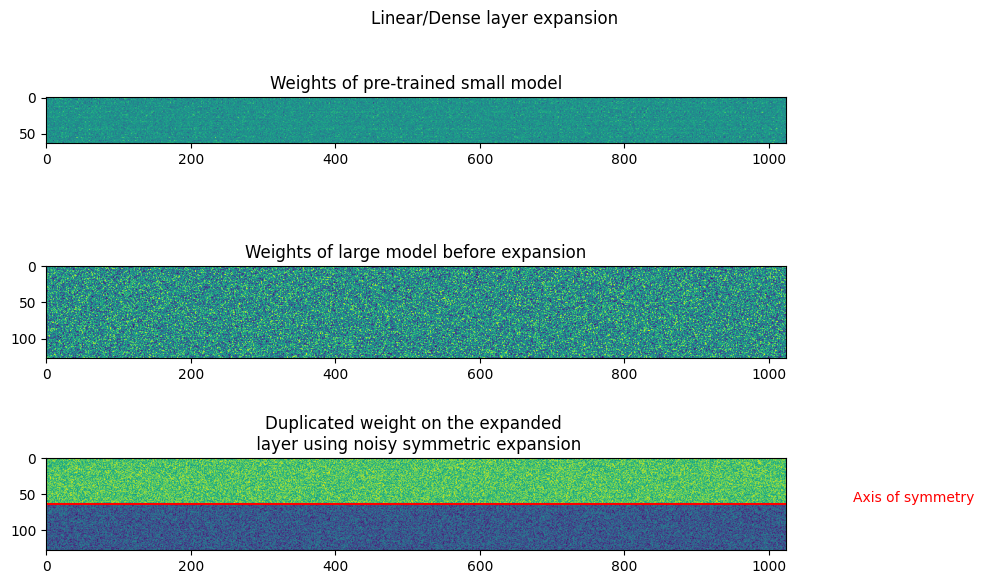

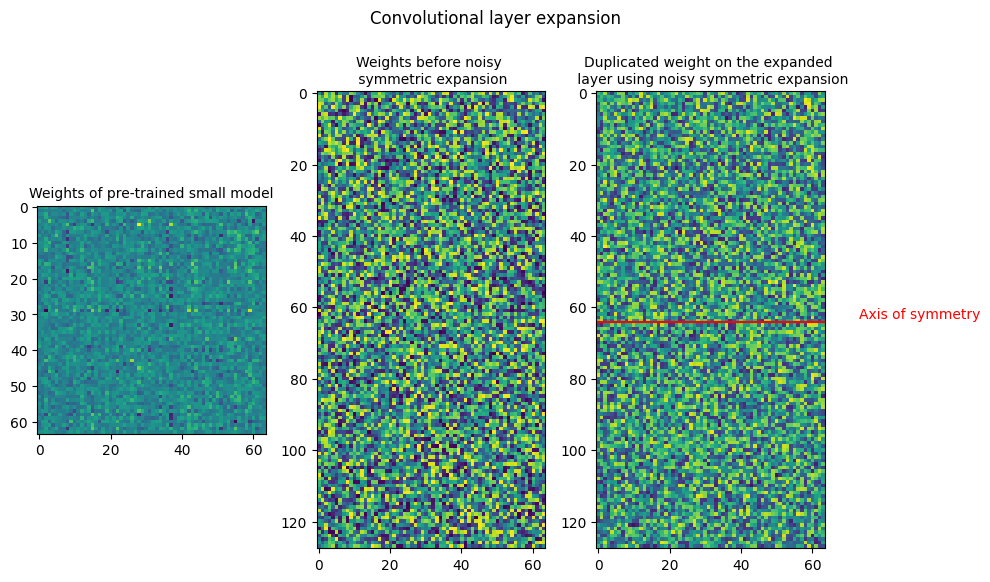

## Diagonal Expansion

$W_{s} -> Source \ weight $

$W_{diagonal} -> Expanded \ weight$

$\eta_1 -> Noise 1$

$\eta_2 -> Noise 2$

$W_{diagonal}  = \begin{bmatrix}
W_s & 0 \\
0 & W_s 
\end{bmatrix}
$

Similar to symmetric expansion, the weights of the linear and convolutional layers are plotted. It is visible in the plots that the along the primary diagonal, the sub-matrices are copied from the small layer weight and the secondary diagonal has only 0s.


As diagonal expansion requires scaling along two dimensions, not all layers can be scaled using this technique.
In the first training, for layers that are not scaled along both dimensions, symmetric expansion is used and diagonal expansion for the other layers.


Another iteration uses diagonal expansion only along layers with scaling along both dimensions while the other layers are randomly initialized.


The second image shows the model weights by scaling up the image and modifying the colors to improve the visibility. 


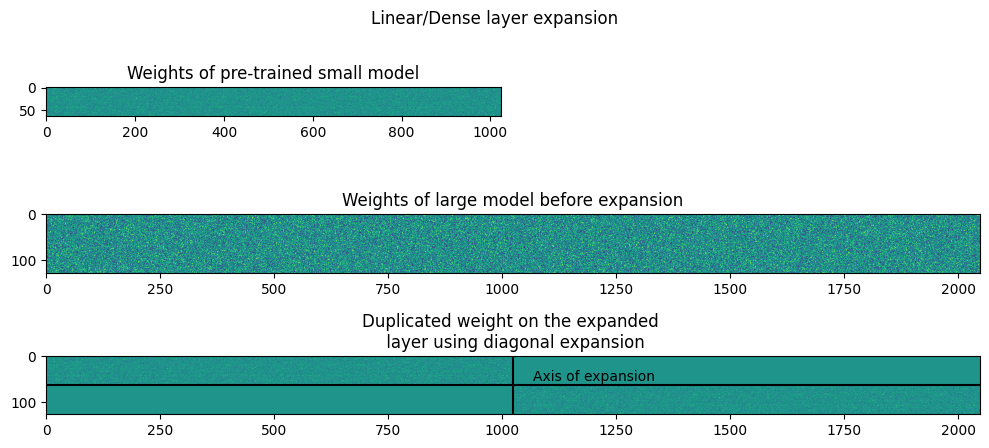

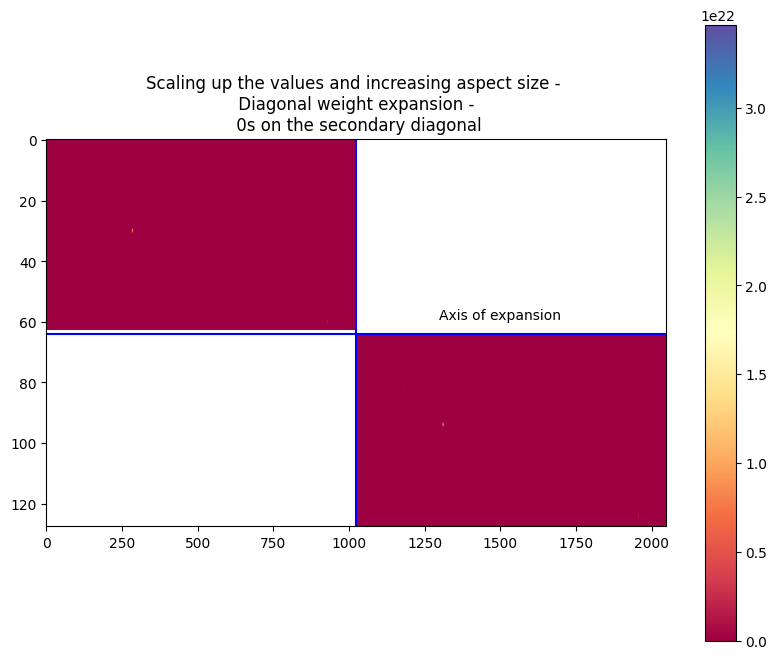

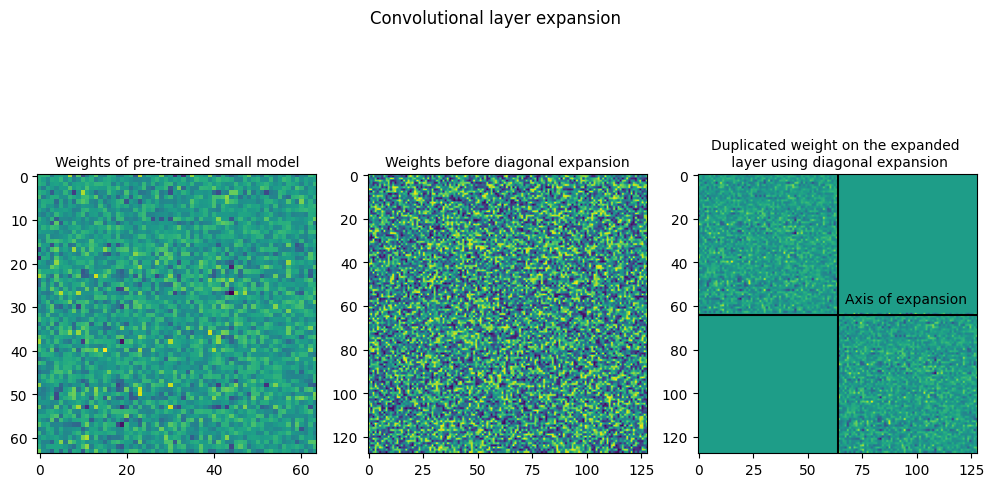


## Noisy Diagonal

$W_{s} -> Source weight $

$W_{noisydiagonal} -> Expanded weight$

$\eta_1 -> Noise 1$

$\eta_2 -> Noise 2$

$W_{noisydiagonal}  = \begin{bmatrix}
W_s + \eta_1 & - \eta_1 \\
\eta_2 & W_s - \eta_2
\end{bmatrix}
$


This expansion method is similar to the noisy symmetric method, where noise is added to each row, while inverting the sign of the noise. This is done for function preservation of the expansion.


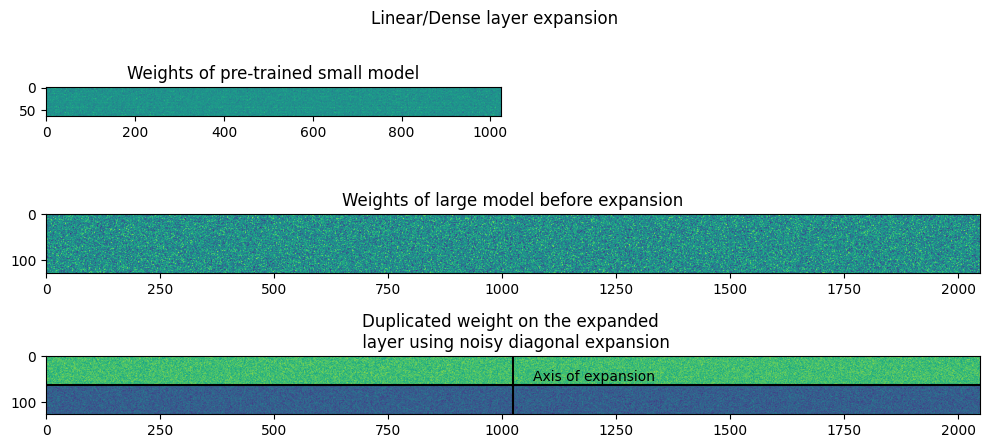


The plots below are used to check for the weights after expansion, and are a scaled up from the weight in the previous image. The second image is a difference of the weights in quarter 1 and quarter 3, in order to check if they are equal, as they seem identical.

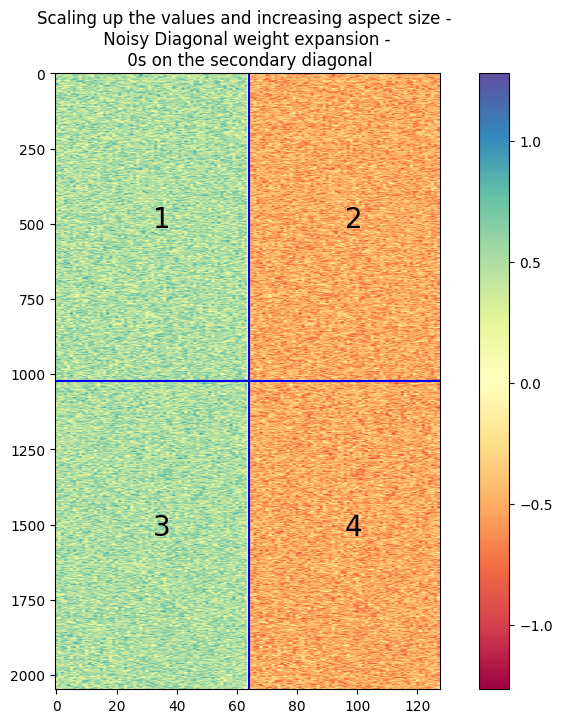

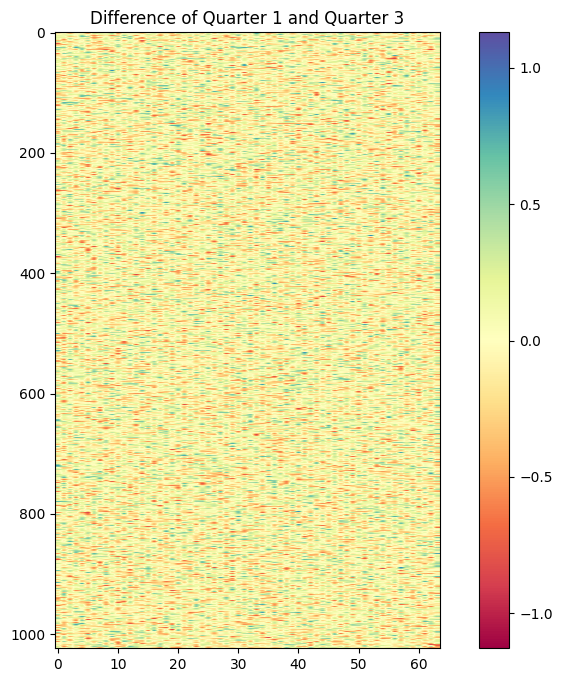

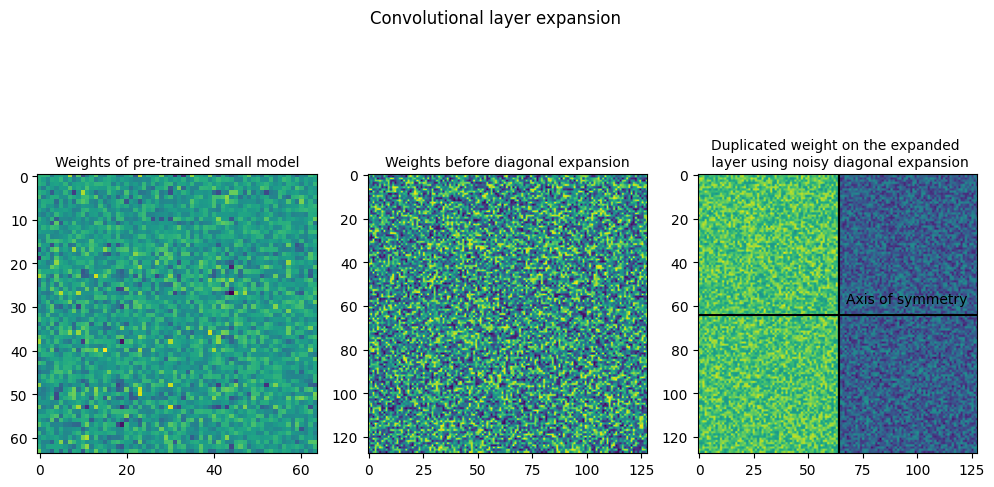


## Analysis

The performance metrics of the models is stored and compared. Each model is trained for 10 epochs and the methods with "High initial LR" are models that are trained with a higher initial learning rate, i.e., `0.001`

A lower initial learning rates is used during training of the models, as during training, a few methods with a high initial learning rate were not able to perform well. This can be seen in the table below where training with a high initial learning rate for symmetric expansion gives a high training and validation loss. A possible reason for this could be that as the weights are initialized from the small model, they are possible closer to the ideal weights, compared to the weights computed by training the model from scratch. 

In order to check if this can be fixed, the initial learning rate is modified and further lowered (`0.0001`), which has yielded better results. The other methods are then trained using a lower initial learning rate. The difference in the performance with the change in initial learning rate is given in the table below.

| Method | Validation Accuracy after first epoch | Highest Validation Accuracy achieved |
|------|----------|---------|
|From scratch|48.18%|60.80%|
|Initial LR = 0.001|50.24%|50.24%|
|Initial LR = 0.0001|62.35%|63.29%|

The table also shows the very high validation loss of the noisy methods and haven't been able to perform close to the other methods. This lack of performance is explained and addressed in the next experiment.

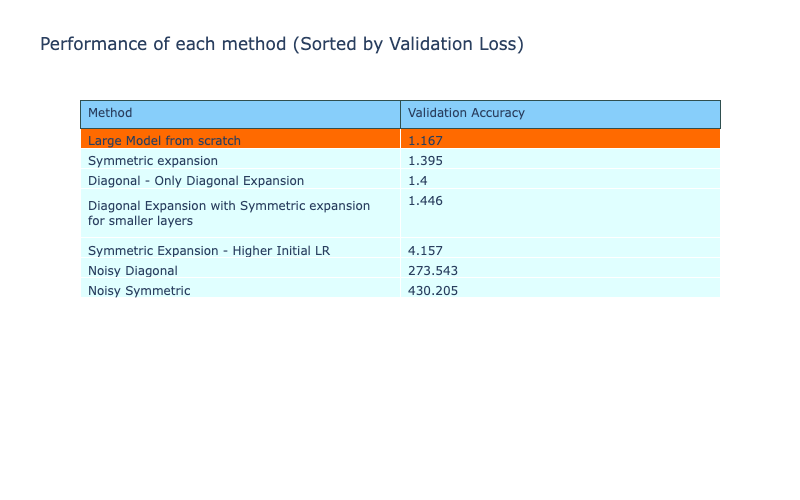

The drop in validation accuracy can be seen in the symmetric expansion with high initial learning rate method. The graphs show the validation accuracy of different methods during training. The plot of validation loss is not shown as due to high validation loss of other methods, the individual plots are not discernible.

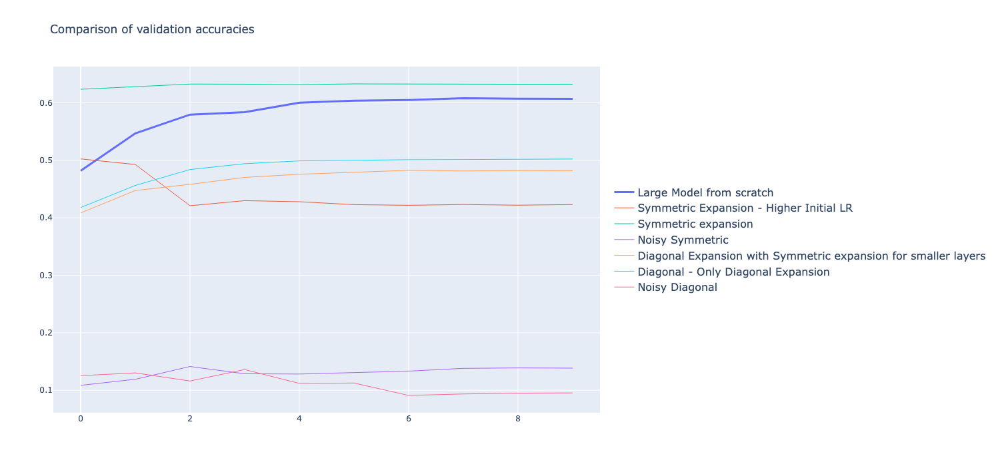


Although the models are unable to have a lower validation loss compared to training from scratch, the validation accuracy of the model after first epoch during training is tracked and compared below. From this, it shows that symmetric expansion techniques had a higher validation accuracy after first epoch, giving them a 'boost' during training. However, the diagonal expansion methods or the noisy expansion techniques still had a lower validation accuracy. 


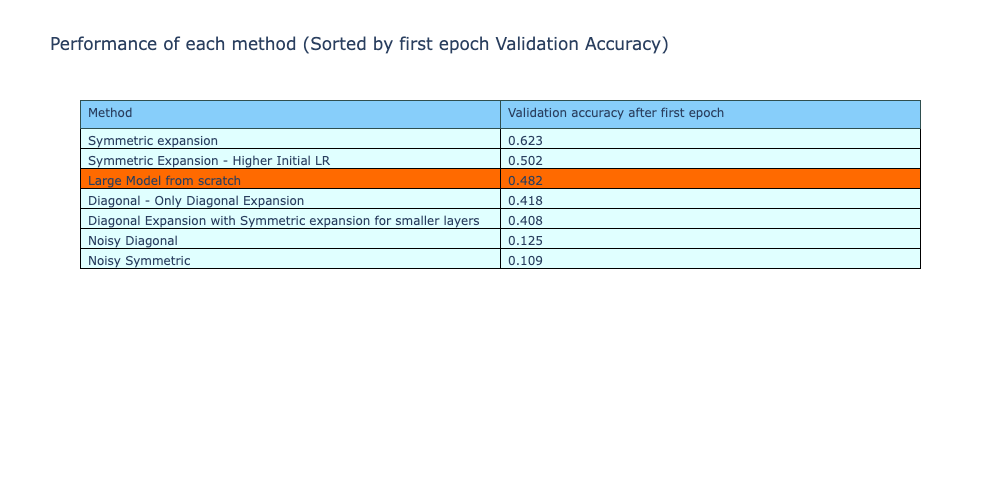

All the metrics of the methods are shown in the table below, comparing the performance of the different weight expansion methods. The table is sorted by decreasing order of validation accuracy and the symmetric method is the only technique that has a higher validation accuracy compared to training from scratch. However, all these techniques still have a higher loss compared to the reference model. The next experiment attempts to address this. 


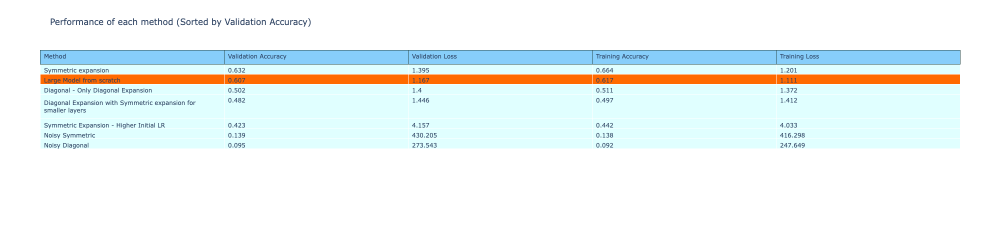

Although the methods are not very efficient, they are faster during the training process as shown by the table and bar graph below. The average, variance, min and max of the time taken per epoch during training is shown in the table below. With the exception of the symmetric expansion with high initial learning rate, all the other methods were faster to train considering per epoch time. 

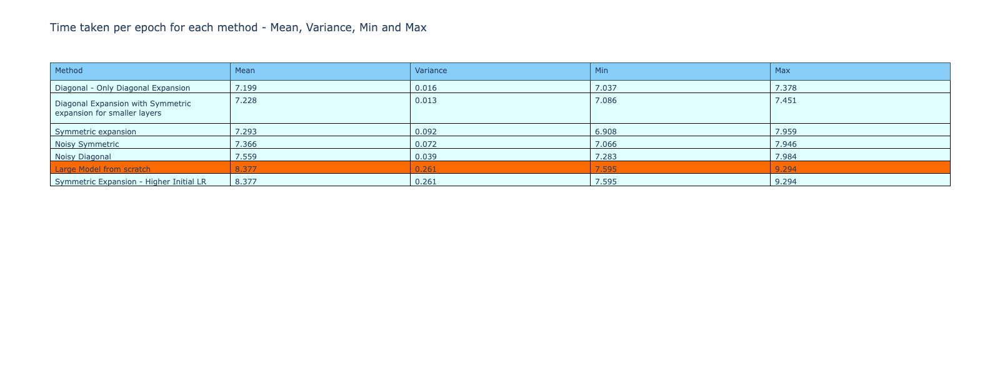
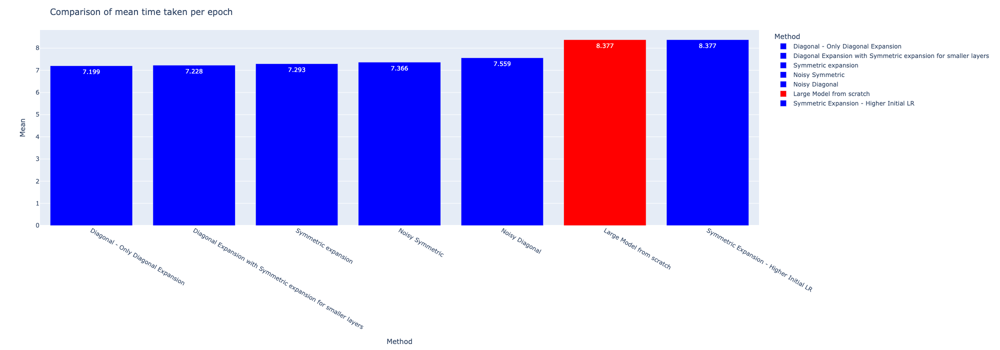

From the training metrics, the diagonal expansion technique is not as effective as symmetric expansion and is also slightly worse than training from scratch.

There could be a few possible reasons for this, one is that not all layers are scaled along both dimensions and therefore diagonal expansion is not as applicable as symmetric, reducing its total effect on the performance of the model.
Another reason could be using only 0s along the secondary diagonal which makes convergence tougher and reduces the performance. 

The noisy methods have been unable to perform well although it would be expected to perform better as there is a larger range of values and adding noise disturbs the symmetry in the weights, allow for better convergence.

The paper describes adding noise only to the range of 10dB of Signal to Noise Ratio (SNR). However, the noise added in these methods were within this range but were unable to perform well. The SNR ratios for each of the methods is given below


| Method | SNR Ratio |
| ------ | --------- |
| Noisy Symmetric | 7.562 |
| Noisy Diagonal |  7.599 |



# Experiment - 3
## Scaling Noise

## Scaling Noise

This experiment is an extension on the methods as implemented and tested in experiment 2. In the previous experiment, it was noticed that while the methods without noise perform well, adding noise drastically reduces the performance of the entire system. 

This is not expected as in the methods without noise, all the elements were either the previous weight or 0, and with the high number of 0s in the initial weights, adding a bit of noise instead would be expected to perform better. However adding noise, on the contrary, reduced the accuracy and increased the loss by a large magnitude. 

One of the issues of this may be that the added noise is not scaled to match the distribution of the reference weights. A modification is made in the script that returns noise drawn from a distribution with the same mean and standard deviation as the weights of the reference layer. This is the noise that is used for initialization of the weights in the larger model. Similar training loops are run for the larger models which make use of scaled weights and the performance metrics are compared. 

## Scaled Noisy symmetric expansion
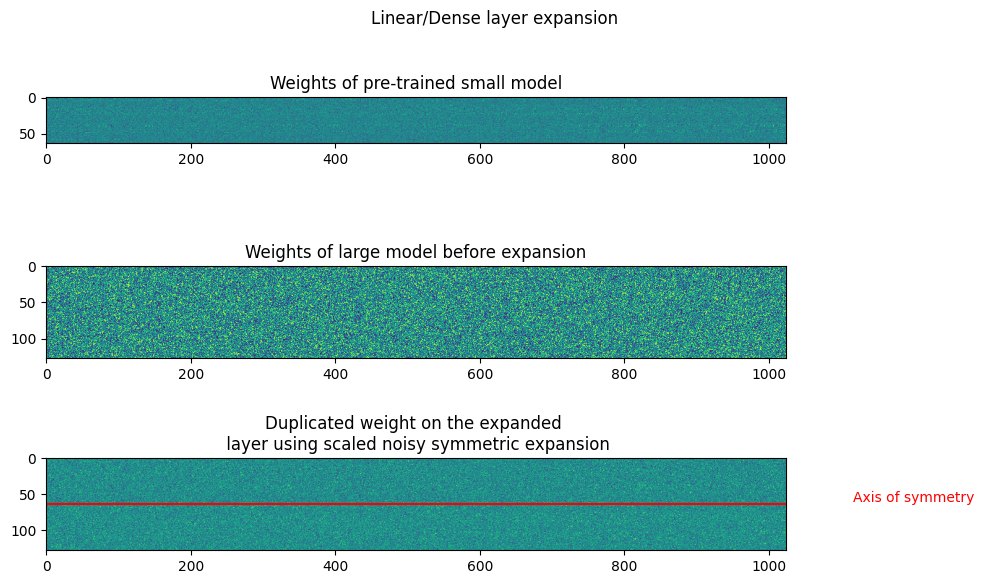

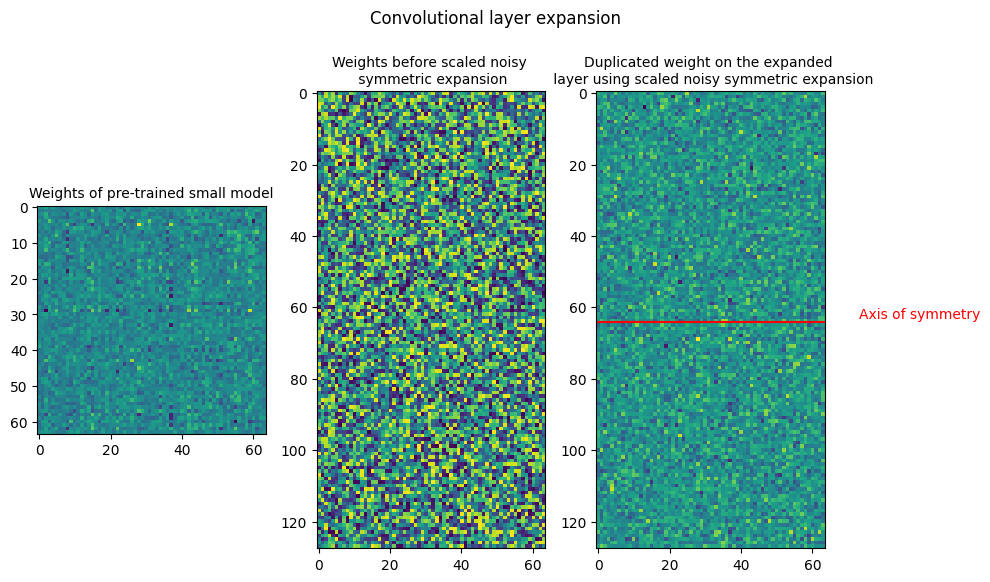

## Scaled Noisy diagonal expansion
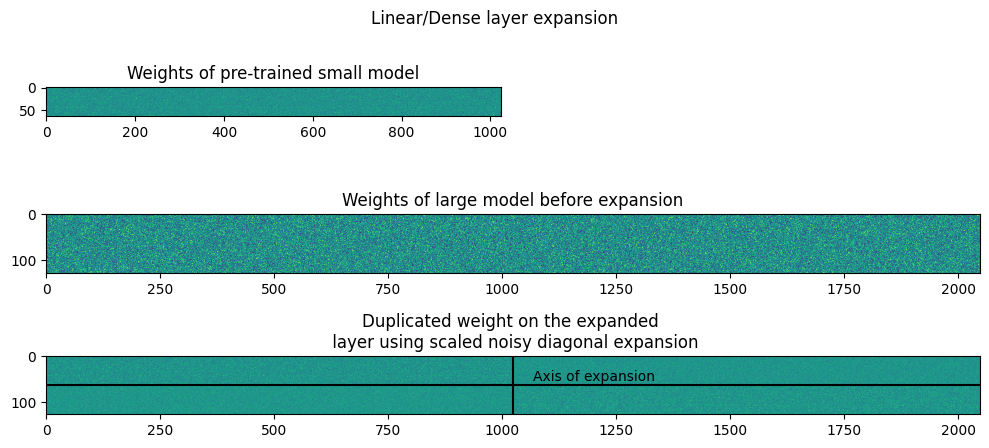


A plot similar to the one used before is given below for noisy diagonal expansion with and without scaling. In the plots and the corresponding colorbars, it can be seen that the range of values when using a scaled noise is much smaller.

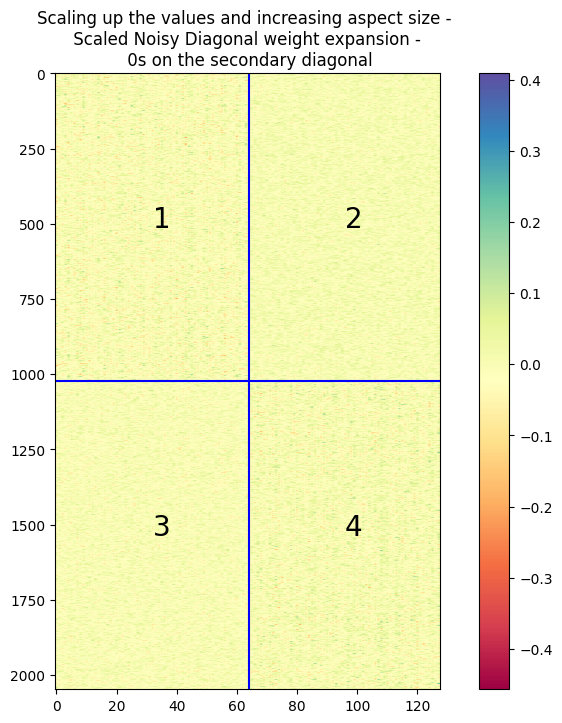 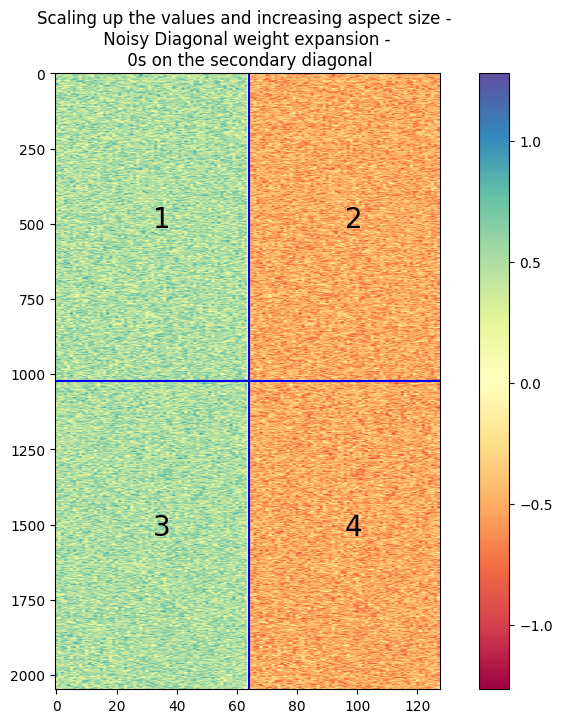

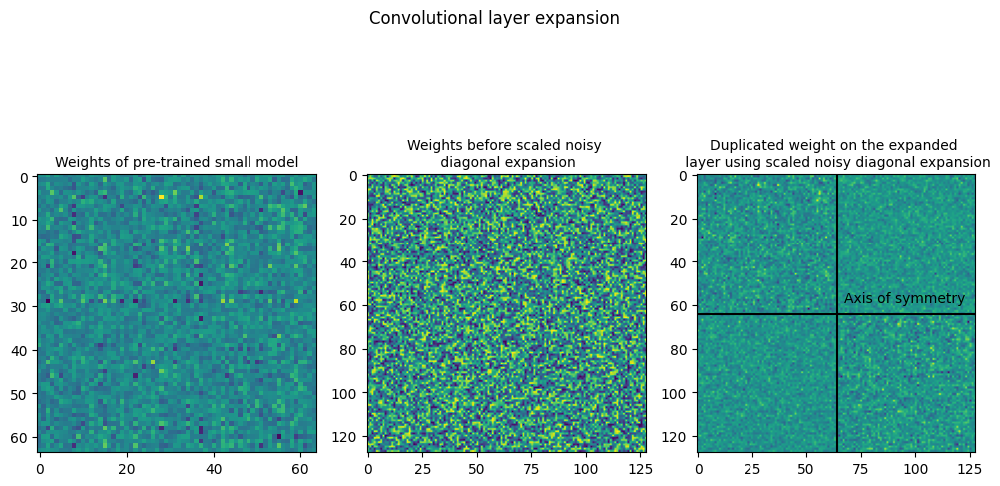



## Analysis
During the training of the model with a low initial learning rate, the convergence seemed slow but there was no ballooning of loss. Due to this, I increased the initial learning rate to 0.001 to check if this would allow for better convergence. Although there is a slight increase in the validation loss with this, the validation accuracy is greatly increased. Overall, all the metrics saw a large improvement compared to the runs without scaled noise. Therefore, the noisy symmetric and noisy diagonal models are trained using a higher (0.001) and lower (0.0001) initial learning rates. The performance metrics on the validation set along with the corresponding SNR ratios are given below.

| Method | Validation Accuracy | Validation Loss | SNR Ratio | Note |
| -------| --------- | ------------ | ----- | ---- |
| Symmetric - Without scaled noise | 13.85% | 430.2051 |  7.562 | 
| Symmetric - With scaled noise | 63.60% | 1.3962 | 0.639 | High LR |
| Diagonal - Without scaled noise | 10.86% | 2093.7175 | 7.599 | |
| Diagonal - With scaled noise | 64.72% | 1.1190 | 0.09166 | High LR |

It can be theorized that by using scaled noise, the convergence is improved as the weights are now closer to the actual values on the pre-trained model. The significant improvement in both the techniques shows that using scaled noise is more suitable for the expansion methods with noise. 

## Performance metrics comparison

Similar to the analysis presented after Experiment-2, the validation accuracy after first epoch is shown for each of the methods. Both the noisy symmetric methods using scaled noise had a higher first epoch validation accuracy compared to the reference model (training from scratch). 

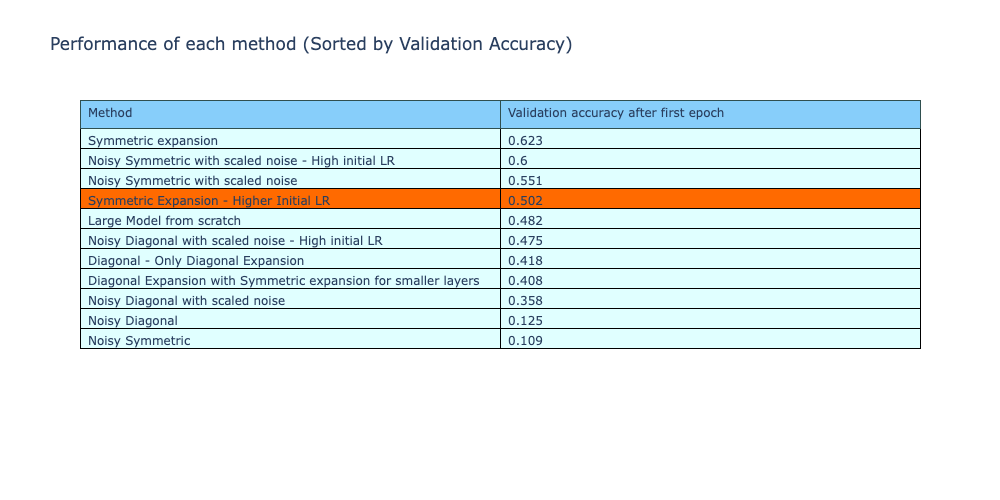

Checking the validation losses of the methods, the two scaled noise methods are now able to perform better and have a lower validation loss compared to the reference model.

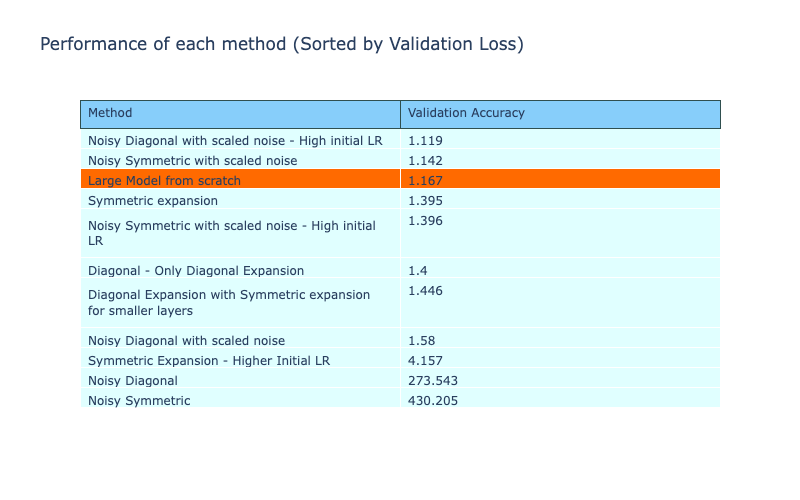

The table with performance metrics of all the methods are given below. The rows are sorted by validation accuracy. The noisy diagonal and noisy symmetric methods with scaled noise and high initial learning rate had a higher validation accuracy compared to all the other methods. This is a significant improvement from the performance of the methods without scaled noise, which have the lowest validation accuracies of all methods.

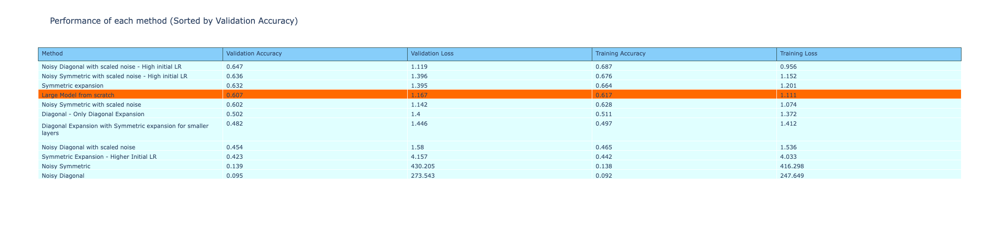

A similar comparison of the time taken per epoch for training of each of the methods is given below. The methods with scaled noise also have a lower training time per epoch compared to training from scratch, even after considering the variance and deviations in the time. A bar plot of the comparison of time per epoch is also shown in the second image. 

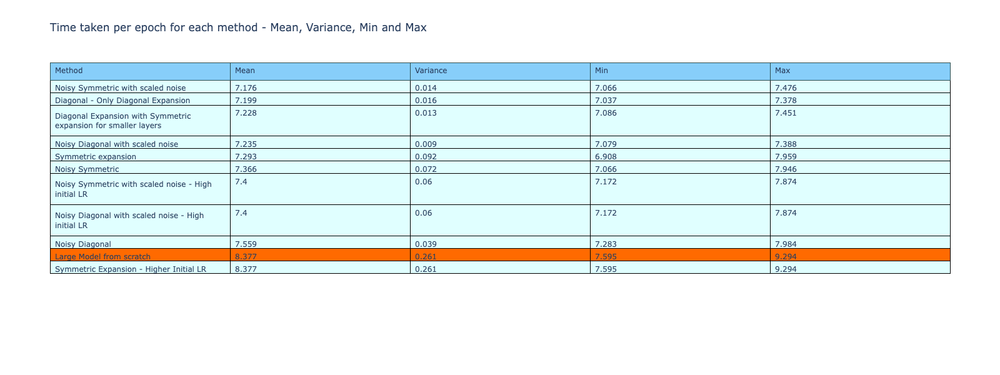

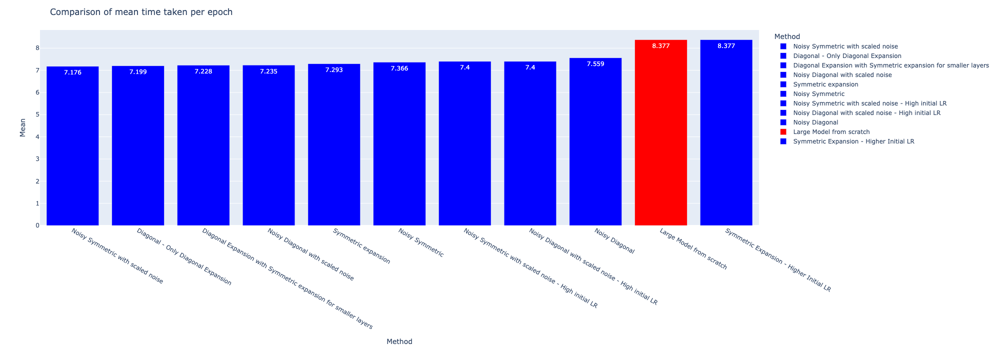

# Experiment - 4
## Envelope expansion

$W_{s} -> Source weight $

$W_{envelope} -> Expanded \ weight$

$W_{noisy \ envelope} -> Expanded \ weight \ with \ noise$


$W_{envelope}  = \begin{bmatrix}
0.. & ... & ..0 \\
0.. & W_s & ..0 \\
0.. & ... & ..0 \\
\end{bmatrix}
$

$W_{noisy \ envelope}  = \begin{bmatrix}
\eta.. & ... & .. \eta \\
\eta.. & W_s & ..\eta \\
\eta.. & ... & ..\eta \\
\end{bmatrix}
$

$ \eta = Noise $

This experiment aims to study the important parts of the convolutional layer and propose a new method which focuses on expanding the weights by occupying the important part of the convolutional layer with the weights from the reference layer.

In order to study the important features of convolutional layers, a large model used in the previous experiments, is trained on the CIFAR10 dataset. Grad-CAM is used to visualize the convolutional layers of the model and study the important features. The Grad-CAM code is taken from the [Keras website](https://keras.io/examples/vision/grad_cam/).

For the Grad-CAM, the visualization is created by averaging the activations generated by feeding multiple images, in order to get a better picture of the activations across a large set of inputs.

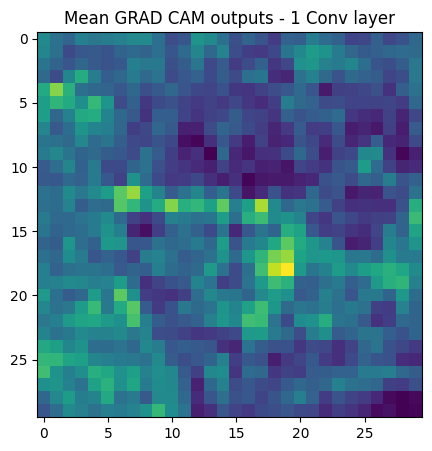
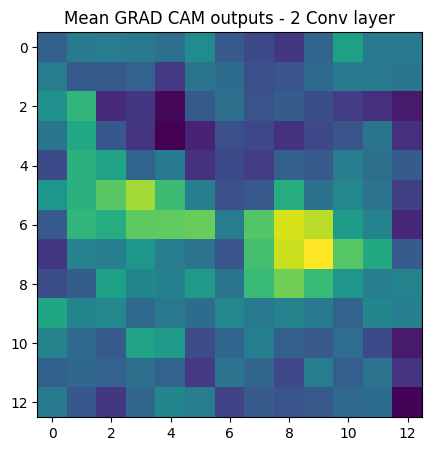

From the Grad-CAM outputs, it can be said that the central weights of the convolutional layer have a larger contribution to the final output of the model.

However, in comparison, the weight expansion techniques majorly place the weights along the corners, leading to a mismatch. A visualization is given below for better explanation. The visualization is of diagonal expansion, where the green parts are the source weights ( taken from pre-trained small model ) and the blue denotes the central weights of the source weights. However, the central weights of the expanded layer are denoted by green, and there is almost no overlap between the weights. 

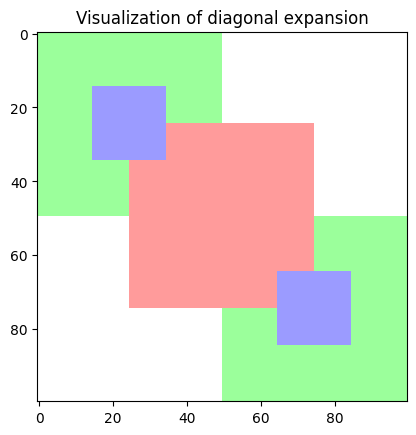

In order to test out my hypothesis that keeping the weights in the center can further increase the performance, I intend to test out a new method, an envelope expansion, which creates the new layer with the source weight in the center of the expanded layer.

## Analysis including the envelope expansion method



There are 4 different variations of the envelope expansion that is experimented, these are
- Envelope expansion
- Envelope expansion - High initial LR
- Noisy envelope expansion with scaled noise
- Noisy envelope expansion with scaled noise - High initial LR


Comparing the first epoch validation accuracy of the methods, all 4 methods have a higher accuracy than the reference method (training from scratch). 

`Note - The methods which were not performing well and were covered in the previous analysis have been omitted.`

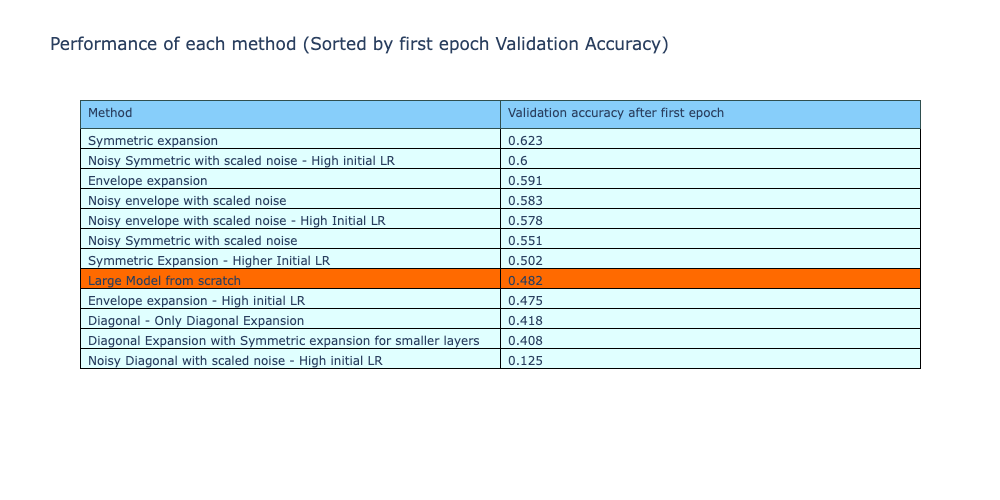

By sorting the validation losses of the methods after training, 3 of the 4 envelope expansion methods perform better than the reference method, denoting an improved performance of the method by placing the weights in the central region of the expanded layer.

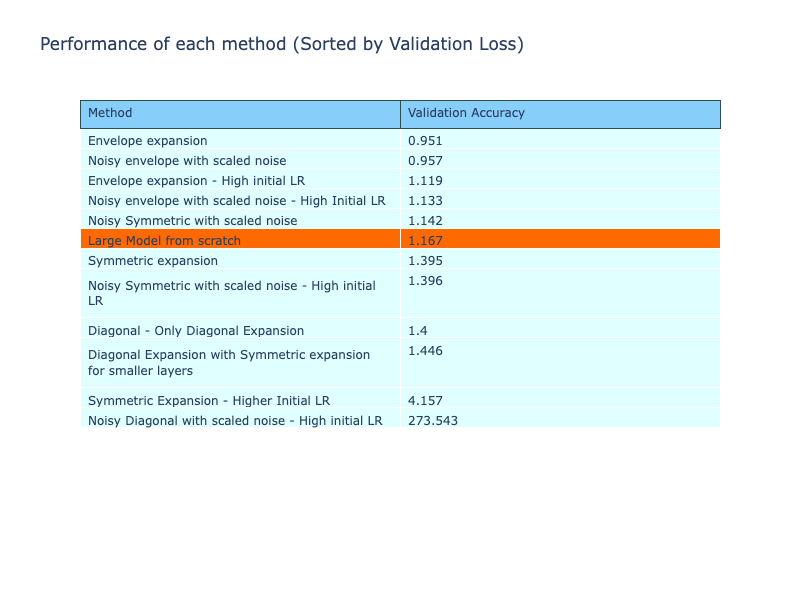

The table below shows all the performance metrics of the model, sorted by validation accuracy. From the 4 methods of envelope expansion, 3 of the methods perform better than the reference method, with all of them being the best performing compared to all the other methods implemented so far.

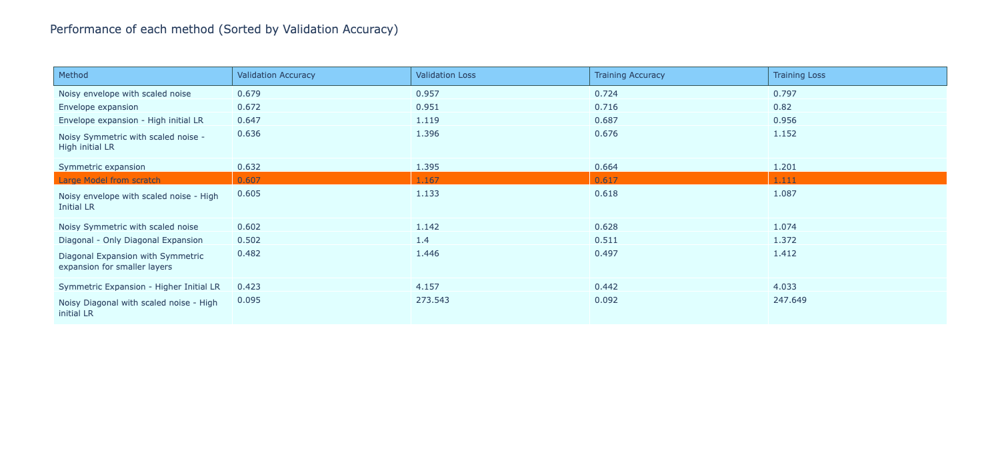

A comparison of the time per epoch during training of the methods show a continuation in the trend, i.e., all the models are faster to train than the reference method with the exception of 'Symmetric expansion with high initial LR'

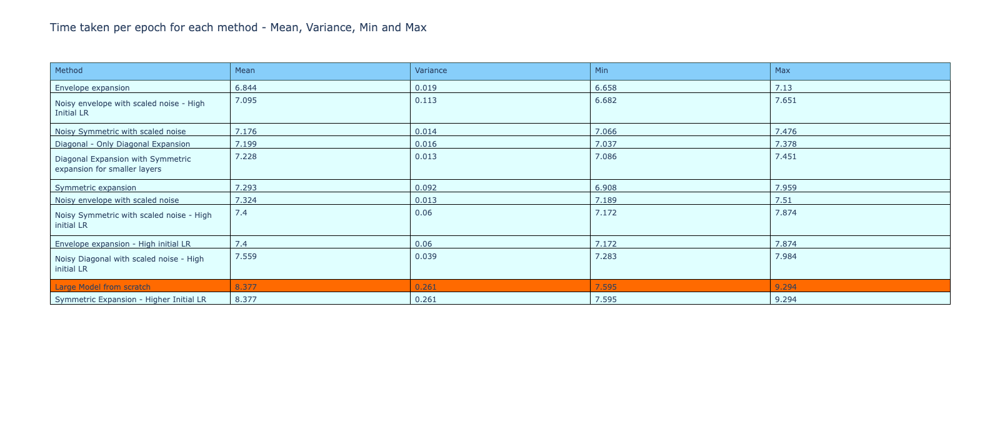

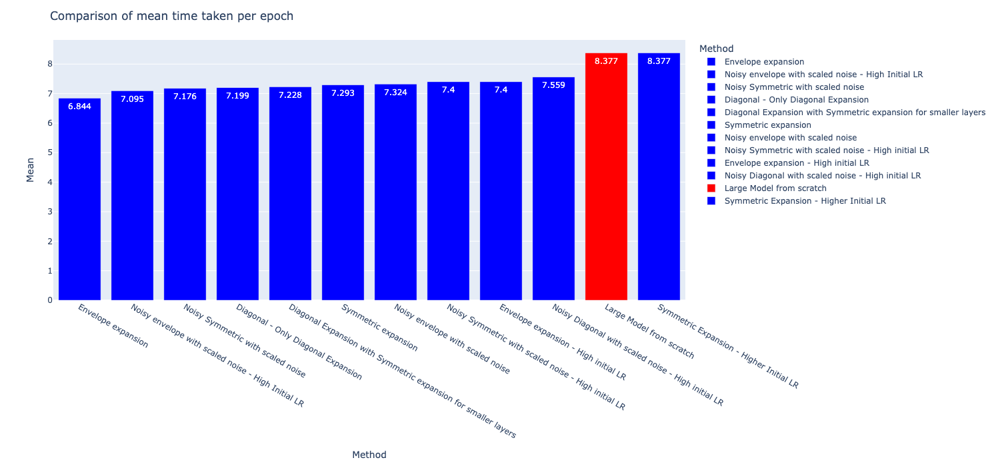

# Experiment - 5 
## Net2Net

## [Chen, Tianqi, Ian Goodfellow, and Jonathon Shlens. "Net2net: Accelerating learning via knowledge transfer." arXiv preprint arXiv:1511.05641 (2015)](https://arxiv.org/abs/1511.05641)

The Net2Net is a model expansion method that was published in 2016. It was a method to expand the models by two methods, growing the model deeper or growing the model wider by adding weights onto the existing layers. 

This method is used on the same models that are used in the experiments above. As the models are not grown in depth, the Net2Net-Wider is used to increase the size of the model layers. However, the implementation is unable to expand all the layers. The layers that were not expandable with Net2Net-Wider are as given below. 


## Large Model
| **Layer (Type)**          | **Output Shape**      | **Details**                            | Note |
|---------------------------|-----------------------|-----------------------------------------|-----|
| **Rescaling**             | (32, 32, 3)          | Scales inputs by 1/255                 ||
| **Conv2D**                | (30, 30, 32)         | Filters: 32, Kernel Size: (3, 3), ReLU ||
| **MaxPooling2D**          | (15, 15, 32)         | Pool Size: (2, 2)                      ||
| **Conv2D**                | (13, 13, 128)        | Filters: 128, Kernel Size: (3, 3), ReLU| Expanded from small model, 64 -> 128|
| **MaxPooling2D**          | (6, 6, 128)          | Pool Size: (2, 2)                      ||
| **Conv2D**                | (4, 4, 64)           | Filters: 64, Kernel Size: (3, 3), ReLU |Not expandable by Net2Net-Wider|
| **Flatten**               | (1024)               | Flattens input                         ||
| **Dense**                 | (128)                | Units: 128, ReLU Activation            |Expanded from small model, 64 -> 128|
| **Dense**                 | (10)                 | Units: 10                              |Not expandable by Net2Net-Wider|

The Conv2D layer has the same number of output layers but the number of input layers are higher as the previous layer has been expanded. In the previous techniques, we were able to expand the weights of these layers too using the pre-trained model weights. However, this is not possible with the Net2Net wider and these layers are not modified. 

The Net2Net-wider also has two implementations, one with a classic Net2Net expansion and the other adds on noise to the weights. Both these methods are trained keeping the other training parameters the same as the previous experiments. 

The code for Net2Net is used from the GitHub repo given [here](https://github.com/paengs/Net2Net)

The validation accuracy after the first epoch is given below. Compared to other methods, the Net2Net methods had a higher accuracy than the reference model but were lower than the other better performing methods. In Net2Net, the number of layers which are expanded are lower, as described above, and this could be a reason for the low initial accuracy.

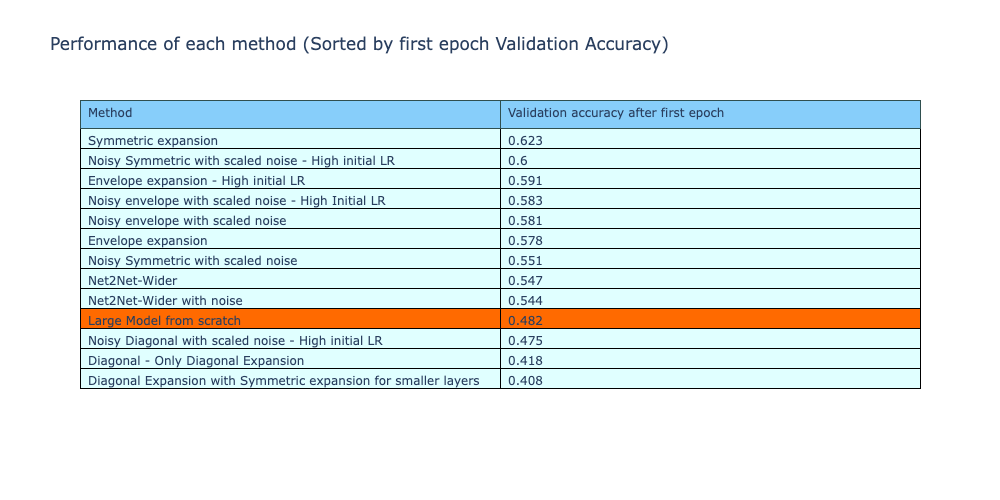

Comparing the validation loss metrics of the methods after training, the Net2Net-wider method has been able to perform better than the methods proposed in Scaling Smart. Few of the envelope expansion methods are the only ones that are better performing than the Net2Net models.

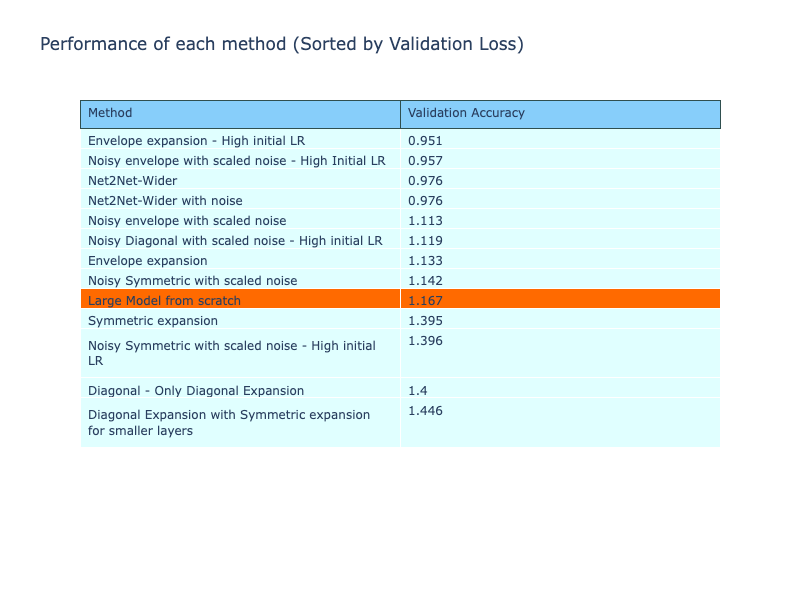

All the performance metrics of the methods are given below, comparing them to Net2Net models, with the performance being sorted by validation accuracy. The Net2Net models performed better than the reference models and many of the other methods, with some of the envelope expansions beating the Net2Net. From the metrics, it is evident that the Net2Net expanded models have performed very well, demonstrating a significant improvement in performance across metrics.

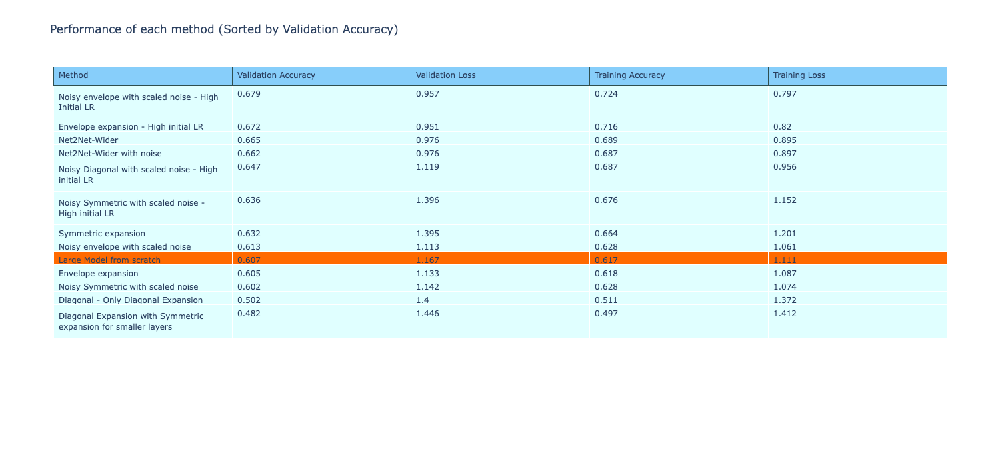

The time taken for training per epoch of each method is given below, and the Net2Net models were the fastest to train among all methods. These could be due to the better suited expansion method used in the Net2Net-wider method, setting the weights of the much closer to the (hypothetical) target weights and therefore faster to converge. The metrics of time taken during training is given below in the table and a graphical comparison is shown in the second image. 

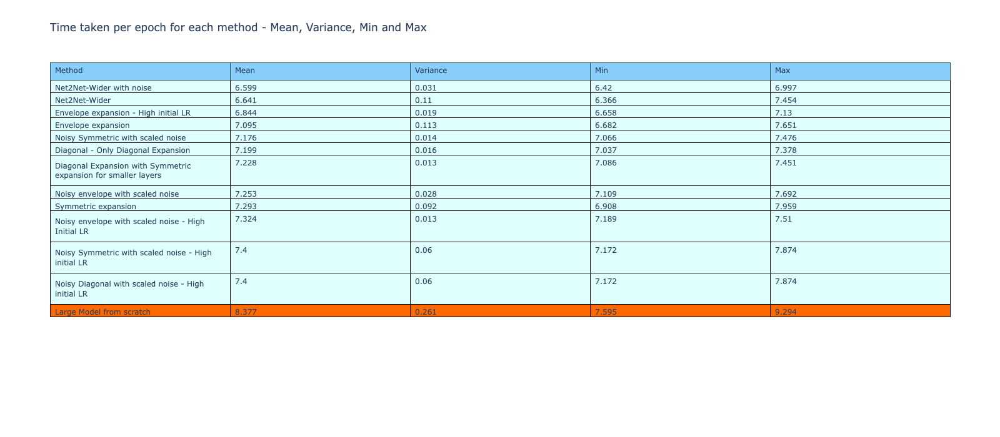
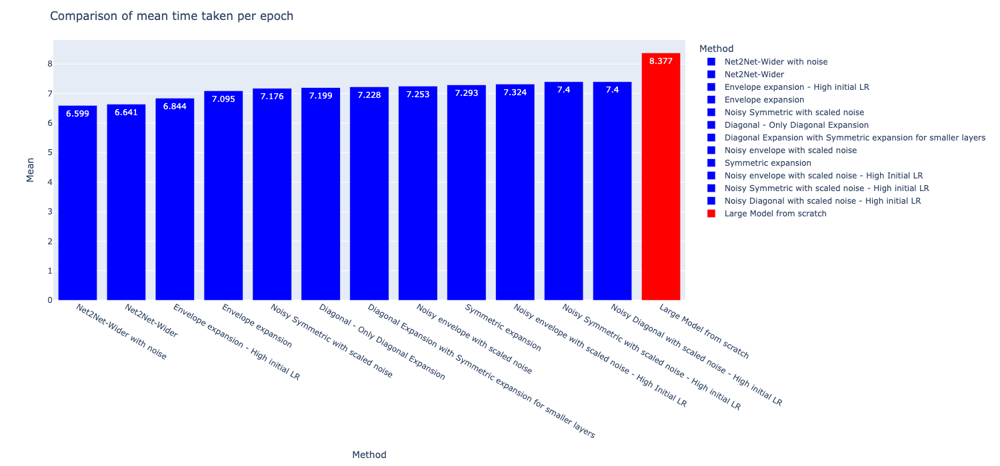

# Conclusion


To conclude, from the experiments, it is evident that weight expansion methods can have a significant effect in the performance of an expanded model. 

This method is ideal in cases where a small model is trained for a particular, before a larger model is created and trained from scratch on the data. With this method, the computation spent on the small model is wasted.

Through the project, I was able to look at three different methods of expansion. Firstly, the knowledge distillation algorithm which was modified to perform expansion. Second, the expansion of the weight matrices of the models as described in the paper Scaling Smart, and lastly the Net2Net expansion, also a form of weight expansion.

The knowledge distillation algorithm was unable to improve the performance of the expanded model, however, it was useful to study the positive effect of using the smaller model's logits for training the expanded model.

The weight expansion performed better in comparison. The method allowed for using the knowledge learnt by the small model to be transfered to the large model, which gave it a "boost" in training. This can be seen from the spike in the first epoch validation accuracy when the models are trained using weight expansion, giving the model a better foundation to start off from. These would allow for faster convergence of the model weights and possibly higher accuracy than can be achieved by only training from scratch.

In order to check how long would a large model have to be trained from scratch to reach the accuracy of the weight expansion techniques, a large model is trained from scratch for 50 epochs continuously. The validation accuracy of the model during the training is given below
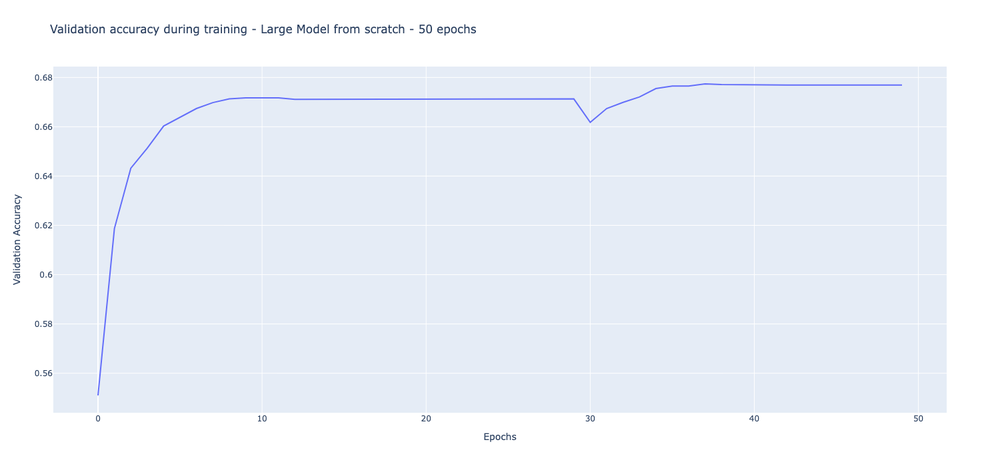

The highest accuracy achieved by the large model when trained from scratch for 50 epochs is `67.69%`. However, the Noisy envelope expansion with scaled noise and High LR achieved a validation accuracy of `67.9%` in only 10 epochs of training. While other expansion methods were unable to get a validation accuracy higher than `67.69%`, the methods were only trained for 10 epochs while the large model is trained for 50 epochs, a increase of `5x` in the number of epochs. With the weight expansion technique, I believe the methods can not only give a higher validation accuracy after first epoch, it would also improve the final performance of the model after training if they were trained for more epochs.

Another advantage of using the weight expansion was the evident speeding up of the training process. Almost all of the weight expansion methods were faster than training from scratch, demonstrating the reduction of computational load.

Tracking back to the objectives of the experiment as described at the start, I have been able to draw a few conclusions
 - Weight Expansion has been able to "redeem" computation spent on smaller pre-trained models. This can be observed by the increase in first epoch accuracy during training of weight expansion methods.
 - By using weights of the small model trained on the dataset, many of the weight expansion models achieved a higher accuracy compared to training from scratch.
 - The initialization of the weights of the model can reduce the computation required. This can be seen from the reduction in training time per epoch when using weight expansion methods.

Further to these objectives, a drawback of the noisy weight expansion methods was identified, where after the addition of noise, the performance was severely affected. While the noise was within the acceptable SNR ratios described in the paper, the models still performed poorly. This was addressed in Experiment 3, where the noise is drawn from a uniform sample with the same mean and standard deviation as the reference weights. With this modification, the performance of the model was greatly improved.

For improving the weight expansion techniques, a Grad-CAM analysis is performed to study the activations of the convolutional layers in the model. This analysis was done to study the part of the convolutional layer that contributed most to the predictions. From the analysis, it could be observed that the central regions of the convolutional layers played an important role in the outputs of the model. By devising a new weight expansion method, the envelope expansion, the weights in the expanded layer are now placed at the center. This method proved fruitful and was the best performing method among all the others.

# Limitations and Future Work

This work looks at implementing model expansion using pre-trained small models, focusing specifically on simple neural networks and Convolutional Neural Networks for image classification. This was chosen as there is minimal work in this area, as model expansion is well researched from the context of LLMs. 

One of the limitations in this work is related to the weight expansion methods for convolutional layers. In case of a change in kernel, the weight expansion would have to be reworked as the methods are meant for two convolutional layers that have the same kernel size.

Weight expansion technique is fairly simple to apply on the expanded model, as it is similar to initialization of model weights. This would not require the modification of the training loops of the model, which is also one of the objectives of Scaling Smart. However, one drawback that I observed was the selection of learning rate before training an expanded model. During the experiments, the performance of the expansion methods was highly dependant on the initial learning rate even though the learning rate scheduler is kept the same. Therefore, the initial learning rate of expanded models have to be chosen carefull before the training is undertaken.  

A future work can look at studying model expansion for a larger variety of layers, including slightly more complicated RNN or Attention cells.  

Due to the large number of experiments and training runs to be carried out, the convolutional neural networks used in this project were kept simple. With larger, more complex models, computation would have been a limiting factor and reduce the comprehensiveness of the study. A future work could look at implementing these model expansion techniques in larger, more popular models like `ResNet` and `VGG`.

In order to study the computational efficiency of the models, the memory consumption during training and the gradient norms were tracked. Ideally, I would have liked to see a lower memory usage and smaller magnitude of gradient updates with model expansion techniques. However, the TensorFlow API could not track the memory used during training on MPS. In order to track memory, I trained the models on Amazon Sagemaker Studio with T4 GPUs. However, the tracked memory did not provide any meaningful analysis. Similarly, the gradient analysis did not yield any useful results. A future work could look at possibly performing a more robust study focused on the memory or gradient computation. 



The objectives of future work can also differ by looking at other tasks including audio classification, object recognition or image generation, to name a few. 

